<a href="https://colab.research.google.com/github/CA683-Group99/Wind-Energy-Prediction/blob/main/4_IslandElectricityRandomForestModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [292]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import io
import requests


from plotly.offline import iplot
import plotly.graph_objs as go
from plotly import tools
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

from datetime import tzinfo, timedelta, datetime, date

# Any results you write to the current directory are saved as output.

import plotly.express as px
import seaborn as sns

In [293]:
!pip install --upgrade scikit-learn

Requirement already up-to-date: scikit-learn in /usr/local/lib/python3.7/dist-packages (0.24.1)


# System Demand and Generation: Actual and Prediction

### Data description
* **System Demand** - represents the predicted electricity production required to meet national consumption.

* **date** - 
* **REGION** - All / Ireland / Nrthern Ireland
* **ActualDemandMW** - Unit MW
* **ForecastDemandMW** - 
* **ForecastWindMW** - 
* **ActualWindMW** - 
* **ActualGenerationMW** - 
* **hour** - 
* **isweekday** - 
* **month** - 
  
Actual and forecast System Demand are shown in **15 minute intervals.**

The data came from EirGrid Group about all island power systems and has been prepared by us for further analysis.

Source: https://smartgriddashboard.eirgrid.com/#all/demand

# Weather Data
 Weather data from weather stations: Belmullet (suffix _BEL), Dublin Airport (_DUB), Shannon Airport (No suffix) and Cork Airport (suffix _COR)

For each station, for example Cork Airport, please see the on https://data.gov.ie/dataset/cork-airport-hourly-data :

Hourly Elements:

| ID | ELEMENT | Unit |
| --- | --- | --- |       
|rain|Precipitation Amount|mm|
|**temp**|Air Temperature|°C|
| wetb|	Wet Bulb Air Temperature|  °C|
|dewpt| Dew Point Air Temperature|	°C	|	
|vappr|	Vapour Pressure	|		hpa|
|rhum	|	Relative Humidity	|	%|
|msl	|	Mean Sea Level Pressure				|		hPa|
|**wdsp**	|	Mean Hourly Wind Speed		|		kt|
|wddir|	Predominant Hourly wind Direction	|	kt|
|ww		Synop Code Present Weather - decode below
|w		Synop Code Past Weather - decode below
|sun		Sunshine duration						hours
|vis		Visibility							m
|clht		Cloud Ceiling Height - if none value is 999			100s feet
|clamt		Cloud Amount							okta

In [294]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [295]:
import os
os.chdir('/content/drive/MyDrive/CA683Project')


In [296]:
fileP = 'IslandElectricity2017_2020v3.csv'
newdf = pd.read_csv(fileP, parse_dates=[1], na_values=" ")

In [297]:
#Krystian: Looking for maximal extreme values
print('-----------DATA SIZE -------------')
print(newdf.shape)           # 10 Columns, 35044 rows
count_row = newdf.shape[0]   # 10 Columns
count_col = newdf.shape[1]   # 35044 rows
print('Rows: ', count_row, ', Columns: ', count_col)

print('-----------DATA INFO -------------')
print(newdf.info())

print('-----------DATA MAX Values -------------')
newdf.max()

print('-----------DATA COLUMNS-------------')
columns = newdf.columns.values.tolist()
print (columns)

print('-----------BASIC STATISTICS-------------')
newdf.describe()

-----------DATA SIZE -------------
(32137, 93)
Rows:  32137 , Columns:  93
-----------DATA INFO -------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32137 entries, 0 to 32136
Data columns (total 93 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Unnamed: 0          32137 non-null  int64         
 1   date                32137 non-null  datetime64[ns]
 2   ind_BEL             32137 non-null  int64         
 3   rain_BEL            32137 non-null  float64       
 4   ind.1_BEL           32137 non-null  int64         
 5   temp_BEL            32137 non-null  float64       
 6   ind.2_BEL           32137 non-null  int64         
 7   wetb_BEL            32137 non-null  float64       
 8   dewpt_BEL           32137 non-null  float64       
 9   vappr_BEL           32137 non-null  float64       
 10  rhum_BEL            32137 non-null  int64         
 11  msl_BEL             32137 non-null  float64     

,Unnamed: 0,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,ind.3_BEL,wdsp_BEL,ind.4_BEL,wddir_BEL,ww_BEL,w_BEL,sun_BEL,vis_BEL,clht_BEL,clamt_BEL,ind_DUB,rain_DUB,ind.1_DUB,temp_DUB,ind.2_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,ind.3_DUB,wdsp_DUB,ind.4_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,...,ind.3,wdsp,ind.4,wddir,ww,w,sun,vis,clht,clamt,ind_COR,rain_COR,ind.1_COR,temp_COR,ind.2_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,ind.3_COR,wdsp_COR,ind.4_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,month,year
count,32137.000000,32137.0,32137.000000,32137.0,32137.000000,32137.0,32137.000000,32137.000000,32137.000000,32137.000000,32137.000000,32137.0,32137.000000,32137.0,32137.000000,0.0,0.0,0.0,0.0,0.0,0.0,32137.000000,32137.000000,32137.000000,32137.000000,32137.000000,32137.000000,32137.000000,32052.000000,32052.000000,32137.000000,32137.0,32137.000000,32137.000000,32136.000000,32137.000000,32137.000000,32137.000000,32137.000000,32137.000000,...,32137.0,32137.000000,32137.0,32137.000000,32137.000000,32137.000000,32137.000000,32137.00000,32137.000000,32137.000000,32137.000000,32137.000000,32137.000000,32137.000000,32137.000000,32137.000000,32137.000000,32052.000000,32052.000000,32137.000000,32137.0,32137.000000,32137.0,32137.000000,32137.000000,32137.000000,32137.000000,32135.000000,32137.000000,32137.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000,32136.000000
mean,16068.000000,0.0,0.164707,0.0,10.373317,0.0,8.976320,7.390637,10.669194,82.047111,1011.092386,2.0,12.235803,2.0,201.226001,NaN,NaN,NaN,NaN,NaN,NaN,0.481563,0.089946,0.020942,9.793705,0.031521,8.304780,6.652282,10.213260,81.935854,1012.613573,2.0,9.811028,2.000156,207.651855,15.121573,29.824937,0.162974,27909.695989,288.152192,...,2.0,9.181846,2.0,193.263217,18.070106,35.669073,0.153960,22181.01254,281.400068,5.665992,0.678813,0.153608,0.008526,9.980630,0.042443,8.531251,7.576130,10.858617,86.039748,1013.489346,2.0,9.916545,2.0,214.836170,17.345085,32.903165,0.169409,28134.895286,286.179046,5.589507,16067.500000,4213.433431,1410.427324,1372.008472,4255.746048,-11.428009,32.938907,11.500000,6.707991,2018.814040
std,9277.297137,0.0,0.517021,0.0,3.996543,0.0,3.799098,4.242278,3.011980,10.997939,13.367860,0.0,6.699090,0.0,92.286377,NaN,NaN,NaN,NaN,NaN,NaN,0.964250,0.424245,0.143191,5.102788,0.176496,4.506175,4.553224,3.156843,12.034440,12.683247,0.0,4.811008,0.027891,80.981149,22.974227,27.028569,0.318778,13660.939966,399.924254,...,0.0,5.281052,0.0,86.777367,23.689598,29.224708,0.313973,12486.44517,408.480795,2.419045,1.163489,0.569085,0.091943,4.633888,0.387528,6.020495,4.487407,3.242104,12.090678,12.397220,0.0,5.170548,0.0,83.479601,23.552553,27.951107,0.331617,18071.939248,419.037335,2.396051,9277.008462,848.776649,1094.062884,987.325954,753.511004,526.517442,23.152582,6.922294,3.528963,1.112341
min,0.000000,0.0,0.000000,0.0,-3.300000,0.0,-4.400000,-9.700000,2.900000,35.000000,959.100000,2.0,0.000000,2.0,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,-5.600000,0.000000,-49.900000,-8.900000,3.100000,25.000000,965.900000,2.0,0.000000,2.000000,0.000000,1.000000,0.000000,0.000000,100.000000,1.000000,...,2.0,0.000000,2.0,0.000000,1.000000,0.000000,0.000000,100.00000,1.000000,0.000000,0.000000,0.000000,0.000000,-6.900000,0.000000,-49.000000,-9.200000,3.100000,26.000000,970.100000,2.0,0.000000,2.0,0.000000,1.000000,0.000000,0.000000,15.000000,1.000000,0.000000,0.000000,2394.750000,0.000000,-44.750000,1939.250000,-1415.000000,-0.943098,0.000000,1.000000,2017.000000
25%,8034.000000,0.0,0.000000,0.0,7.500000,0.0,6.200000,4.200000,8.300000,75.000000,1002.400000,2.0,7.000000,2.0,150.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,6.200000,0.000000,5.100000,3.300000,7.700000,75.000000,1004.300

In [298]:
import plotly.express as px

fig = px.scatter(newdf, x='date', y='ActualDemandMW')
fig.show()

In [299]:
eirgridCols = ['ActualDemandMW', 'ActualGenerationMW' , 'ForecastWndMW' , 'ActualWindMW', 'NetTotal_MW' ]
len(eirgridCols)

5

In [300]:

fig = make_subplots(
    rows=len(eirgridCols), cols=1,
    subplot_titles=(eirgridCols ))
i =1 

fig.print_grid 
for col in eirgridCols:
  missingAW = newdf.loc[newdf[col].isnull() == True]
  #fig = px.scatter(missingAW, x='date', y='hour')
  fig.add_trace(go.Scatter(x=missingAW.date, y=missingAW['hour'], name=(col),  hovertext='label'), i, 1, secondary_y=False)
  i = i+1

fig.update_layout(height=800, width=1200)
fig.show()

In [301]:
fig = go.Figure()
for col in eirgridCols:
  fig.add_trace(go.Box(y=newdf[col], name=col))
fig.show()

Will need to tidy up null values properly!

In [302]:
newdf.loc[newdf['month'].isnull() == True]

,Unnamed: 0,date,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,ind.3_BEL,wdsp_BEL,ind.4_BEL,wddir_BEL,ww_BEL,w_BEL,sun_BEL,vis_BEL,clht_BEL,clamt_BEL,ind_DUB,rain_DUB,ind.1_DUB,temp_DUB,ind.2_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,ind.3_DUB,wdsp_DUB,ind.4_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,...,wdsp,ind.4,wddir,ww,w,sun,vis,clht,clamt,ind_COR,rain_COR,ind.1_COR,temp_COR,ind.2_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,ind.3_COR,wdsp_COR,ind.4_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,isweekday,month,year
32136,32136,2021-03-01,0,0.0,0,2.5,0,2.0,1.2,6.7,91,1033.5,2,3,2,80,NaN,NaN,NaN,NaN,NaN,NaN,3,0.0,0,0.1,0,0.0,-0.2,NaN,NaN,1034.9,2,4,2,90.0,2,11,0.0,12000,...,2,2,120,2,11,0.0,20000,999,0,3,0.0,0,4.1,5,-49.0,2.0,NaN,NaN,1032.7,2,8,2,50,2,11,0.0,20000.0,999,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [303]:
newdf = newdf.loc[newdf['month'].isnull() == False]

In [304]:
newdf.loc[newdf['ActualWindMW'] < 0]

,Unnamed: 0,date,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,ind.3_BEL,wdsp_BEL,ind.4_BEL,wddir_BEL,ww_BEL,w_BEL,sun_BEL,vis_BEL,clht_BEL,clamt_BEL,ind_DUB,rain_DUB,ind.1_DUB,temp_DUB,ind.2_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,ind.3_DUB,wdsp_DUB,ind.4_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,...,wdsp,ind.4,wddir,ww,w,sun,vis,clht,clamt,ind_COR,rain_COR,ind.1_COR,temp_COR,ind.2_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,ind.3_COR,wdsp_COR,ind.4_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,isweekday,month,year
275,275,2017-07-12 11:00:00,0,0.0,0,17.4,0,13.6,10.2,12.4,62,1019.5,2,7,2,40,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,17.7,0,14.6,12.1,14.1,70.0,1019.1,2,5,2,20.0,2,11,0.7,30000,...,4,2,220,2,11,1.0,60000,250,6,0,0.0,0,17.4,0,12.7,8.2,10.9,55.0,1019.2,2,4,2,310,2,11,1.0,65000.0,250,5,275.0,4326.25,15.00,-1.50,4124.25,90.75,-0.034672,11.0,True,7.0,2017.0
2987,2987,2017-11-02 11:00:00,0,0.0,0,10.9,0,9.0,6.9,10.0,76,1018.2,2,4,2,160,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,9.9,0,8.1,5.9,9.4,77.0,1017.7,2,6,2,320.0,2,11,0.0,30000,...,3,2,30,2,11,0.0,50000,31,7,0,0.0,0,10.9,0,10.7,10.5,12.7,97.0,1017.8,2,3,2,340,2,11,0.1,15000.0,3,7,2987.0,4995.75,20.50,-2.25,4013.25,935.75,-0.045038,11.0,True,11.0,2017.0
2988,2988,2017-11-02 12:00:00,0,0.0,0,11.2,0,8.8,6.0,9.4,70,1017.9,2,5,2,180,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,10.3,0,8.0,5.2,8.9,71.0,1017.5,2,5,2,310.0,2,11,0.0,30000,...,3,2,30,2,11,0.0,40000,30,7,0,0.0,0,11.1,0,10.6,10.1,12.4,94.0,1017.5,2,2,2,10,2,11,0.0,25000.0,8,7,2988.0,5025.75,11.75,-3.25,4025.25,961.50,-0.064667,12.0,True,11.0,2017.0
2989,2989,2017-11-02 13:00:00,0,0.0,0,11.2,0,8.3,5.0,8.7,65,1017.5,2,4,2,180,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,10.3,0,7.4,3.7,8.0,64.0,1017.2,2,6,2,330.0,2,11,0.0,30000,...,2,2,10,2,11,0.1,40000,31,7,0,0.0,0,12.1,0,10.9,9.7,12.1,86.0,1017.1,2,3,2,40,2,11,0.0,25000.0,16,7,2989.0,4955.50,10.50,-2.00,3993.00,926.00,-0.040359,13.0,True,11.0,2017.0
8241,8241,2018-06-09 09:00:00,0,0.0,0,14.7,0,12.3,10.1,12.3,73,1017.5,2,5,2,320,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,19.0,0,14.7,11.2,13.3,60.0,1016.5,2,5,2,130.0,2,11,1.0,17000,...,3,2,310,10,42,0.0,13000,7,8,0,0.0,0,18.0,0,15.1,12.9,14.8,72.0,1016.1,2,3,2,30,2,11,1.0,20000.0,999,1,8241.0,4107.25,37.50,-0.50,3905.75,134.25,-0.012174,9.0,False,6.0,2018.0
8242,8242,2018-06-09 10:00:00,0,0.0,0,15.1,0,12.1,9.3,11.7,68,1017.5,2,4,2,340,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,19.8,0,15.0,11.1,13.2,57.0,1016.4,2,7,2,100.0,5,0,1.0,15000,...,4,2,10,2,11,0.0,16000,10,8,0,0.0,0,19.2,0,15.9,13.4,15.4,69.0,1015.9,2,4,2,80,2,11,1.0,20000.0,999,4,8242.0,4222.50,31.75,-0.25,3785.75,306.50,-0.005921,10.0,False,6.0,2018.0
9605,9605,2018-08-05 05:00:00,0,0.0,0,12.8,0,11.6,10.5,12.7,85,1023.1,2,6,2,190,NaN,NaN,NaN,NaN,NaN,NaN,3,0.0,0,13.6,0,12.8,12.1,14.1,91.0,1024.2,2,1,2,220.0,2,11,0.0,30000,...,1,2,200,2,11,0.0,40000,32,7,0,0.0,0,13.8,0,12.6,11.6,13.6,86.0,1024.5,2,3,2,320,2,11,0.0,50000.0,21,7,9605.0,2676.75,45.00,-1.25,3162.00,-363.00,-0.046698,5.0,False,8.0,2018.0
27297,27297,2020-08-11 09:00:00,0,0.0,0,17.7,0,16.1,15.0,17.1,84,1017.9,2,2,2,30,NaN,NaN,NaN,NaN,NaN,NaN,3,0.1,0,15.6,0,15.5,15.5,17.5,99.0,1017.4,2,4,2,350.0,28,42,0.0,2500,...,3,2,280,10,22,0.1,7000,28,7,0,0.0,0,17.1,0,14.8,13.1,15.0,77.0,1017.4,2,5,2,330,10,42,1.0,15000.0,10,5,27297.0,4631.00,163.25,-12.75,4099.00,509.00,-0.275319,9.0,True,8.0,2020.0
27298,27298,2020-08-11 10:00:00,0,0.0,0,18.7,0,16.9,15.6,17.7,82,1017.7,2,4,2,10,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,16.4,0,16.1,15.9,18.0,97.0,1017.6,2,4,2,10.0,10,22,0.0,2500,...,3,2,300,10,22,0.1,9000,29,7,0,0.0,0,17.9,0,15.6,13.8,15.9,77.0,1017.3,2,5,2,340,2,11,1.0,30000.0,999,4,27298.0,4710.50,130.50,-13.25,4149.25,557.00,-0.281286,10.0,True,8.0,2020.0
27299,27299,2020-08-11 11:00:00,0,0.0,0,19.7,0,17.1,15.3,17.4,75,1017.7,2,4,2,20,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,16.6,0,16.3,16.1,18.3,97.0,1017.6,

In [305]:
fig = px.scatter(newdf, x='hour', y='ActualDemandMW', facet_col='month', color='isweekday')
fig.show()

In [306]:
fig = px.scatter(newdf, x='hour', y='ActualDemandMW', facet_col='year', color='isweekday')
fig.show()

In [307]:
newdf['WindGenPercent'] = (newdf['ActualWindMW'] / newdf['ActualGenerationMW']) * 100
fig = px.scatter(newdf, x='hour', y='WindGenPercent', facet_col='year')
fig.show()

# Prep smaller dataset to run model : reduced dataset for prototype to known important factors

In [308]:
newdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32136 entries, 0 to 32135
Data columns (total 94 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Unnamed: 0          32136 non-null  int64         
 1   date                32136 non-null  datetime64[ns]
 2   ind_BEL             32136 non-null  int64         
 3   rain_BEL            32136 non-null  float64       
 4   ind.1_BEL           32136 non-null  int64         
 5   temp_BEL            32136 non-null  float64       
 6   ind.2_BEL           32136 non-null  int64         
 7   wetb_BEL            32136 non-null  float64       
 8   dewpt_BEL           32136 non-null  float64       
 9   vappr_BEL           32136 non-null  float64       
 10  rhum_BEL            32136 non-null  int64         
 11  msl_BEL             32136 non-null  float64       
 12  ind.3_BEL           32136 non-null  int64         
 13  wdsp_BEL            32136 non-null  int64     

In [309]:
redds = newdf.loc[:, ['date', 'hour', 'isweekday', 'month', 'year', 'wdsp_BEL', 'wddir_BEL', 'temp_BEL']]

In [310]:
redds = newdf.loc[:, ['date', 'hour', 'isweekday', 'month', 'year',
                      'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
                      'wdsp', 'wddir', 'temp',
                      'wdsp_COR', 'wddir_COR',  'temp_COR',
                      'wdsp_DUB', 'wddir_DUB',  'temp_DUB', 'ActualWindMW', 'ForecastWndMW', 'ActualDemandMW']]

In [311]:
redds.isnull().sum()

date              0
hour              0
isweekday         0
month             0
year              0
wdsp_BEL          0
wddir_BEL         0
temp_BEL          0
wdsp              0
wddir             0
temp              0
wdsp_COR          0
wddir_COR         0
temp_COR          0
wdsp_DUB          0
wddir_DUB         1
temp_DUB          0
ActualWindMW      0
ForecastWndMW     0
ActualDemandMW    0
dtype: int64

In [312]:
#redds = redds.loc[redds['date'] >= "2018-01-01 00:00:00", :]

In [313]:
redds.tail()

,date,hour,isweekday,month,year,wdsp_BEL,wddir_BEL,temp_BEL,wdsp,wddir,temp,wdsp_COR,wddir_COR,temp_COR,wdsp_DUB,wddir_DUB,temp_DUB,ActualWindMW,ForecastWndMW,ActualDemandMW
32131,2021-02-28 19:00:00,19.0,False,2.0,2021.0,4,360,5.1,3,60,7.6,6,80,5.5,7,80.0,5.7,571.75,602.50,5288.00
32132,2021-02-28 20:00:00,20.0,False,2.0,2021.0,2,10,3.8,4,50,5.3,7,70,5.1,6,80.0,4.8,809.75,719.00,4913.25
32133,2021-02-28 21:00:00,21.0,False,2.0,2021.0,5,360,3.4,4,50,4.5,8,60,4.9,5,100.0,3.3,976.75,782.75,4540.50
32134,2021-02-28 22:00:00,22.0,False,2.0,2021.0,3,40,2.9,1,70,3.0,8,80,4.9,5,100.0,2.4,1039.25,776.75,4156.75
32135,2021-02-28 23:00:00,23.0,False,2.0,2021.0,4,70,2.5,1,90,3.7,6,80,4.3,4,110.0,1.2,1034.00,776.00,3907.50


Quick backfill (from previous hour value) for the few missing data points 

In [314]:
#redds.ActualWindMW.fillna(method='ffill', inplace=True)

In [315]:
fig = px.scatter(redds, x='date', y='ActualWindMW')
fig.show()

In [316]:
fig = px.scatter(redds, x='date', y='ForecastWndMW')
fig.show()

In [317]:
fig = px.scatter(redds, x='date', y='ActualDemandMW')
fig.show()

In [318]:
redds.fillna(method='ffill', limit=4, inplace=True)
redds.isweekday = redds.isweekday.astype('bool')

## Correlation matrix and VIF


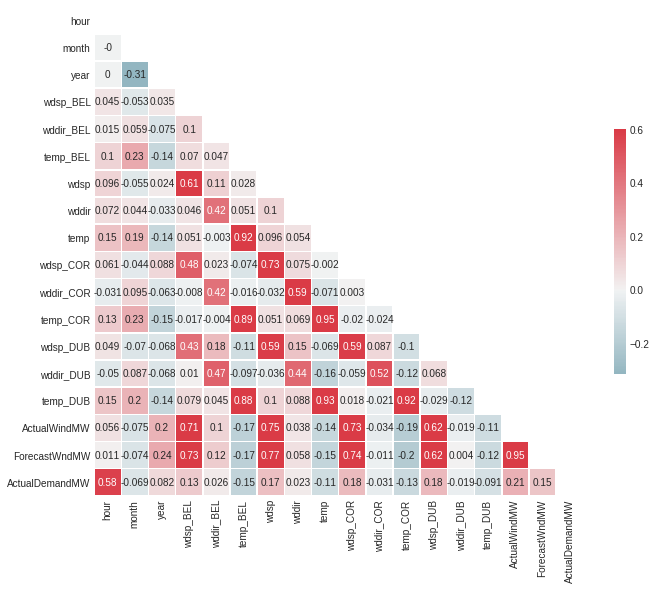

In [319]:
import seaborn as sns

num_df = redds.select_dtypes(['int', 'float'])
# Compute the correlation matrix
corr = num_df.corr()
corr = np.round(corr, 3)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.6, center=0, annot= True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})


In [320]:
X = redds[['hour', 'isweekday', 'month', 'year',
                      'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
                      'wdsp', 'wddir', 'temp',
                      'wdsp_COR', 'wddir_COR',  'temp_COR',
                      'wdsp_DUB', 'wddir_DUB',  'temp_DUB']]

In [321]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices
from statsmodels.api import add_constant

X = redds[['wdsp_BEL', 'wddir_BEL', 'temp_BEL',
                      'wdsp', 'wddir', 'temp',
                      'wdsp_COR', 'wddir_COR',  'temp_COR',
                      'wdsp_DUB', 'wddir_DUB',  'temp_DUB']]
X = add_constant(X)

vif = [variance_inflation_factor(X.to_numpy(), i) for i in range(X.to_numpy().shape[1])]

print(vif[1:])


[1.7549061185515133, 1.4824558581232226, 7.5476839693366555, 2.9042572913666302, 1.753699546310848, 16.617672884416844, 2.431679975638068, 1.8736686693204134, 12.420933211863069, 1.8022513097530317, 1.6467985825508908, 8.78101108936008]


In [322]:
pd.DataFrame(X.iloc[:, 1:].columns, vif[1:])

,0
1.754906,wdsp_BEL
1.482456,wddir_BEL
7.547684,temp_BEL
2.904257,wdsp
1.753700,wddir
16.617673,temp
2.431680,wdsp_COR
1.873669,wddir_COR
12.420933,temp_COR
1.802251,wdsp_DUB


 ## Drop temp_COR and Temp as too correlated to Dublin temp


In [323]:
redds.drop(['temp_COR'], axis=1, inplace=True)
redds.drop(['temp'], axis=1, inplace=True)

# Split data into Training (day of month between 1st and 21st) and Validation (day of the months above 22nd) sets and run Random Forest 

In [324]:
def setdayatt(row):
    row["day"] = row.date.day
    return row

redds["day"] = 0
redds = redds.apply(setdayatt, axis='columns')



In [325]:
from sklearn.model_selection import train_test_split

# Split train vs. Test for day of the month <> 23 to avoid overfitting
X_train_full = redds.loc[(redds.day > 0) & (redds.day < 23), :]
X_valid_full = redds.loc[(redds.day >= 23), :]

y_train = X_train_full.ActualWindMW
X_train_full.drop(['ActualWindMW', 'ActualDemandMW', 'ForecastWndMW', 'day'], axis=1, inplace=True)

y_valid = X_valid_full.ActualWindMW
X_valid_full.drop(['ActualWindMW', 'ActualDemandMW', 'ForecastWndMW', 'day'], axis=1, inplace=True)

# Break off validation set from training data
#X_train_full, X_valid_full, y_train, y_valid = train_test_split(redds, y, train_size=0.8, test_size=0.2,random_state=0)

# "Cardinality" means the number of unique values in a column
# Select categorical columns with relatively low cardinality (convenient but arbitrary)
categorical_cols = [cname for cname in X_train_full.columns if
                    X_train_full[cname].nunique() < 10 and 
                    X_train_full[cname].dtype == "object"]

# Select numerical columns
numerical_cols = [cname for cname in X_train_full.columns if 
                X_train_full[cname].dtype in ['int64', 'float64', 'bool']]

# Keep selected columns only
my_cols = categorical_cols + numerical_cols
X_train = X_train_full[my_cols].copy()
X_valid = X_valid_full[my_cols].copy()


In [326]:
y_train.shape , X_train.shape, y_valid.shape, X_valid.shape

((23232,), (23232, 14), (8904,), (8904, 14))

In [327]:
redds[['date', 'ActualWindMW']].tail(24*6 + 3)


,date,ActualWindMW
31989,2021-02-22 21:00:00,3928.00
31990,2021-02-22 22:00:00,3669.25
31991,2021-02-22 23:00:00,3450.75
31992,2021-02-23 00:00:00,3288.00
31993,2021-02-23 01:00:00,3307.75
...,...,...
32131,2021-02-28 19:00:00,571.75
32132,2021-02-28 20:00:00,809.75
32133,2021-02-28 21:00:00,976.75
32134,2021-02-28 22:00:00,1039.25


In [328]:
y_valid.tail(24*6 + 3)

31461    1765.50
31462    1618.00
31463    1525.00
31992    3288.00
31993    3307.75
          ...   
32131     571.75
32132     809.75
32133     976.75
32134    1039.25
32135    1034.00
Name: ActualWindMW, Length: 147, dtype: float64

In [329]:
X_train.columns

Index(['hour', 'isweekday', 'month', 'year', 'wdsp_BEL', 'wddir_BEL',
       'temp_BEL', 'wdsp', 'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB',
       'wddir_DUB', 'temp_DUB'],
      dtype='object')

## Run model with Performance metrics :  mean_absolute_error, mean_squared_error, r2_score

In [342]:
#from sklearn.metrics import mean_absolute_percentage_error

In [343]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score 

# Preprocessing for numerical data
numerical_transformer = SimpleImputer(strategy='constant')

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Define model
model = RandomForestRegressor(n_estimators=100, random_state=0)

# Bundle preprocessing and modeling code in a pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('model', model)
                     ])

# Preprocessing of training data, fit model 
clf.fit(X_train, y_train)

# Preprocessing of validation data, get predictions
preds = clf.predict(X_valid)

print('MAE:', mean_absolute_error(y_valid, preds))
#print('mean_absolute_percentage_error: ', mean_absolute_percentage_error(y_valid, preds))
print('RMSE:', np.sqrt(mean_squared_error(y_valid, preds))) 
print('Train r2_score:', r2_score(y_valid, preds))

MAE: 273.29347091194967
RMSE: 362.7109530773318
Train r2_score: 0.8527496285087299


In [344]:
validLen = y_valid.shape[0]
preds.shape[0], y_valid.shape[0]

(8904, 8904)

In [345]:
X_validPreds = X_valid.copy()
X_validPreds['preds'] = preds
X_validPreds['actual'] = y_valid

X_validPreds['date'] = X_valid_full['date']

In [346]:
weekValidPred = X_validPreds[-6*24:]


In [347]:


fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))


fig.add_trace(go.Scatter(x=weekValidPred['date'], y=weekValidPred.actual,
                    mode='lines',
                    name='Wind Actual',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=weekValidPred['date'], y=weekValidPred.preds,
                    mode='lines',
                    name='Pred',showlegend=True), 1, 1, secondary_y=False)

fig.show()

In [348]:
actualVal = y_valid[-7*24:]
weekPred = preds[-7*24:]
print("actual: " + str(actualVal.shape) + " pred: " + str(weekPred.shape))


print('MAE:', mean_absolute_error(actualVal, weekPred ))
print('Week RMSE:', np.sqrt(mean_squared_error(actualVal, weekPred))) 
print('Week Train r2_score:', r2_score(actualVal, weekPred))


actual: (168,) pred: (168,)
MAE: 325.3888095238095
Week RMSE: 416.75580552827074
Week Train r2_score: 0.8665018910189557


In [349]:
X_valid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8904 entries, 528 to 32135
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   hour       8904 non-null   float64
 1   isweekday  8904 non-null   bool   
 2   month      8904 non-null   float64
 3   year       8904 non-null   float64
 4   wdsp_BEL   8904 non-null   int64  
 5   wddir_BEL  8904 non-null   int64  
 6   temp_BEL   8904 non-null   float64
 7   wdsp       8904 non-null   int64  
 8   wddir      8904 non-null   int64  
 9   wdsp_COR   8904 non-null   int64  
 10  wddir_COR  8904 non-null   int64  
 11  wdsp_DUB   8904 non-null   int64  
 12  wddir_DUB  8904 non-null   float64
 13  temp_DUB   8904 non-null   float64
dtypes: bool(1), float64(6), int64(7)
memory usage: 982.6 KB


In [350]:
redds.columns

Index(['date', 'hour', 'isweekday', 'month', 'year', 'wdsp_BEL', 'wddir_BEL',
       'temp_BEL', 'wdsp', 'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB',
       'wddir_DUB', 'temp_DUB', 'ActualWindMW', 'ForecastWndMW',
       'ActualDemandMW', 'day'],
      dtype='object')

In [351]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))

fig.add_trace(go.Scatter(x=redds['date'], y=redds['ForecastWndMW'],
                    mode='lines',
                    name='Eirgrid Forecast Wnd',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=redds['date'], y=redds['ActualDemandMW'],
                    mode='lines',
                    name='Demand Actual',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=redds['date'], y=redds['ActualWindMW'],
                    mode='lines',
                    name='Wind Actual',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=X_valid_full['date'], y=preds,
                    mode='lines',
                    name='Pred',showlegend=True), 1, 1, secondary_y=False)


fig.update_layout(
    title_text="Wind actual (blue) vs. Predictions (red) for days 22nd and above each month",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=4000,
    height=500
)
fig.show()

## Model features importance

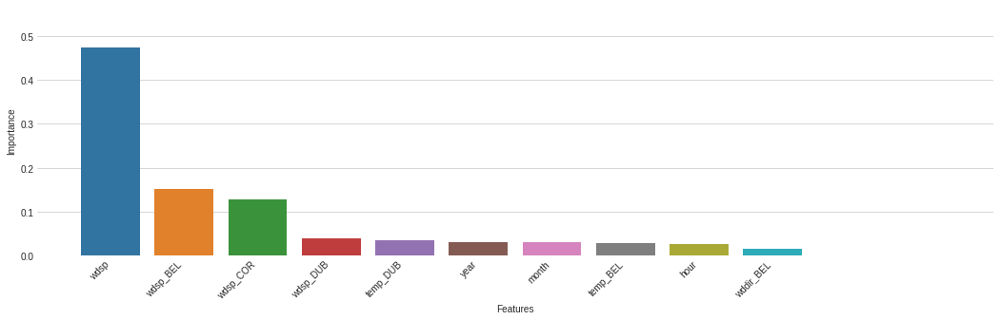

In [352]:
X_cols = X_valid.columns

rfc_fi = pd.DataFrame({'cols':X_cols, 'imp':model.feature_importances_}
                       ).sort_values('imp', ascending=False)

f, ax = plt.subplots(figsize=(18, 5))

chart = sns.barplot(x="cols", y="imp", data=(rfc_fi.loc[rfc_fi.imp > 0.015]))

# Add a legend and informative axis label
ax.set(xlim=(-1, 12), ylabel="Importance",
       xlabel="Features")
sns.despine(left=True, bottom=True)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')

# Pad margins so that markers don't get clipped by the axes
plt.margins(0.2)
# Tweak spacing to prevent clipping of tick-labels
plt.subplots_adjust(bottom=0.15)
plt.show()

# Met Éireann Weather Forecast API
Published by: Met Éireann
 32 
Licensed under: Met Eireann Custom Open Data Licence
https://data.gov.ie/dataset/met-eireann-weather-forecast-api/resource/027da6d5-d819-48d1-9b16-331dba169bd1

In [353]:

from xml.dom.minidom import parse
import xml.dom.minidom


In [354]:
def getWeather(lat, long, name):

    url = "http://metwdb-openaccess.ichec.ie/metno-wdb2ts/locationforecast?lat={};long={}".format(lat, long)
    s = requests.get(url).content

    DOMTree = xml.dom.minidom.parse(io.StringIO(s.decode('utf-8')))

    collection = DOMTree.documentElement
    if collection.hasAttribute("shelf"):
       print ("Root element : ", collection.getAttribute("shelf"))

    # Get all the movies in the collection
    product = collection.getElementsByTagName("product")

    df_cols = ['date', 'wddir', 'wdsp', 'temp']
    rows = []

    product = collection.getElementsByTagName("product")
    timefcs = collection.getElementsByTagName("time")


    # Print detail of each movie.
    for timefc in timefcs:
        if timefc.hasAttribute("from"):
            fromtime =""
            wdeg = None
            wsp = None
            temp = None

            #print ("from: ", timefc.getAttribute("from"))
            fromtime = timefc.getAttribute("from")

            location = timefc.getElementsByTagName('location')[0]

            if (len(location.getElementsByTagName('windDirection')) > 0 ):
                wd = location.getElementsByTagName('windDirection')[0]
                if wd.hasAttribute("deg"):
                    wdeg = float(wd.getAttribute("deg"))
                    #print ("Wi)nd Direction deg: ", wd.getAttribute("deg"))    

            if (len(location.getElementsByTagName('windSpeed')) > 0):
                wsp = location.getElementsByTagName('windSpeed')[0]
                if wsp.hasAttribute("mps"):
                    wsp = float(wsp.getAttribute("mps"))

            if (len(location.getElementsByTagName('temperature')) > 0):
                temp = location.getElementsByTagName('temperature')[0]
                if temp.hasAttribute("value"):
                    temp = float(temp.getAttribute("value"))
        #print ("From: " + fromtime + " Wind Direction deg: " + str(wdeg) + " Wind Speed mps: " + str(wsp))    
        if (wdeg != None):
            rows.append({"date": fromtime, "wddir": wdeg, "wdsp": wsp, "temp": temp})


    # <windDirection id="dd" deg="348.0" name="N"/>
    # <windSpeed id="ff" mps="3.2" beaufort="2" name="Svak vind"/>


    out_df = pd.DataFrame(rows, columns = df_cols)
    
    out_df["date"] = pd.to_datetime(out_df["date"], infer_datetime_format=True, errors='ignore')

    #out_df.to_csv(name + "weather.csv")

    return out_df

In [355]:
# Belmullet: 54.225, -9.991
lat=54.225
long=-9.991

BELMULLETds = getWeather(lat, long, "Belmullet")

In [356]:
# Cork Airport: 51.8382 Longitude: -8.4880
lat= 51.8382
long= -8.4880

corkairportds = getWeather(lat, long, "Cork")

In [357]:
# Shannon Airport, Ireland. Latitude: 52.7012 Longitude: -8.9215.
lat= 52.7012
long= -8.9215

shannonairportds = getWeather(lat, long, "Shannon")

In [358]:
# Dublin Airport in Ireland. Latitude: 53.4264 Longitude: -6.2499
lat= 53.4264
long= -6.2499

dublinairportds = getWeather(lat, long, "Dublin")

In [359]:
left = BELMULLETds.set_index(['date']).copy()
right = dublinairportds.set_index(['date'])
#right.index = right.index.tz_convert(None)

wfds = left.join(right, lsuffix="_BEL", rsuffix="_DUB")

right = shannonairportds.set_index(['date'])
wfds = wfds.join(right, lsuffix="", rsuffix="_SHA")

right = corkairportds.set_index(['date'])
wfds = wfds.join(right, lsuffix="", rsuffix="_COR")
wfds = wfds.reset_index()


In [360]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Met Station"))


fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_BEL'],
                    mode='lines',
                    name='Belmullet Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_COR'],
                    mode='lines',
                    name='Cork Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp'],
                    mode='lines',
                    name='Shannon Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)
fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_DUB'],
                    mode='lines',
                    name='Dublin Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)


fig.update_layout(
    title_text="Wind speed ",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1400,
    height=500
)
fig.show()

In [361]:
# Weather Hourly data wind speed in knt, for some reason, 1 knt = 0.514 m/s
knot = 0.514
wfds.wdsp_BEL = wfds.wdsp_BEL / knot
wfds.wdsp = wfds.wdsp / knot
wfds.wdsp_COR = wfds.wdsp_COR / knot
wfds.wdsp_DUB = wfds.wdsp_DUB / knot


In [362]:
fig = go.Figure()
fig.add_trace(go.Box(y=newdf['wdsp_BEL'], name='BEL'))
fig.add_trace(go.Box(y=wfds['wdsp_BEL'], name='BEL forecast'))
fig.add_trace(go.Box(y=newdf['wdsp_DUB'], name = 'DUB'))
fig.add_trace(go.Box(y=wfds['wdsp_DUB'], name='DUB forecast'))
fig.add_trace(go.Box(y=newdf['wdsp'], name = 'SHA'))
fig.add_trace(go.Box(y=wfds['wdsp'], name='SHA forecast'))

fig.add_trace(go.Box(y=newdf['wdsp_COR'], name = 'CORK'))
fig.add_trace(go.Box(y=wfds['wdsp_COR'], name='CORK forecast'))
fig.show()

# Run predictions

In [363]:
wfds

,date,wddir_BEL,wdsp_BEL,temp_BEL,wddir_DUB,wdsp_DUB,temp_DUB,wddir,wdsp,temp,wddir_COR,wdsp_COR,temp_COR
0,2021-03-19 14:00:00,23.0,10.311284,9.0,358.3,5.252918,10.6,359.0,6.809339,10.9,35.9,6.614786,11.6
1,2021-03-19 15:00:00,20.0,8.949416,8.6,356.7,4.280156,11.1,8.1,6.809339,11.3,49.2,5.252918,11.9
2,2021-03-19 16:00:00,21.1,9.922179,8.7,9.6,4.280156,11.4,12.5,6.031128,11.5,51.9,4.085603,11.6
3,2021-03-19 17:00:00,25.1,10.311284,8.3,25.2,3.891051,10.7,1.5,5.058366,11.1,353.5,3.696498,11.6
4,2021-03-19 18:00:00,28.5,10.116732,7.9,50.1,2.723735,10.0,357.0,4.474708,10.6,12.7,4.863813,11.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,2021-03-28 00:00:00,265.0,22.957198,4.6,215.3,13.618677,5.5,248.0,12.645914,5.3,238.3,16.731518,6.6
107,2021-03-28 06:00:00,276.9,22.568093,5.2,259.1,14.785992,2.9,269.2,10.311284,4.4,268.4,8.171206,4.0
108,2021-03-28 12:00:00,261.2,19.260700,7.8,268.1,17.509728,8.3,265.9,14.396887,8.2,273.5,12.256809,8.8
109,2021-03-28 18:00:00,245.6,18.093385,7.7,252.4,12.062257,8.3,251.2,9.533074,8.1,256.0,9.338521,8.8


In [364]:
wfds["hour"] = 0
wfds["isweekday"] = False
wfds["month"] = 0
wfds['year'] = 0
wfds["day"] = 0
def settimeattfull(row):
    row["hour"] = row.date.hour
    row["isweekday"] = (row.date.isoweekday() < 6) 
    row["month"] = row.date.month
    row["year"] = row.date.year
    row["day"] = row.date.day
    return row

wfds = wfds.apply(settimeattfull, axis='columns')

In [365]:
wfds.columns

Index(['date', 'wddir_BEL', 'wdsp_BEL', 'temp_BEL', 'wddir_DUB', 'wdsp_DUB',
       'temp_DUB', 'wddir', 'wdsp', 'temp', 'wddir_COR', 'wdsp_COR',
       'temp_COR', 'hour', 'isweekday', 'month', 'year', 'day'],
      dtype='object')

In [366]:
redtds = wfds.loc[:, ['hour', 'isweekday', 'month', 'year',
                      'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
                      'wdsp', 'wddir', 'temp',
                      'wdsp_COR', 'wddir_COR',  'temp_COR',
                      'wdsp_DUB', 'wddir_DUB',  'temp_DUB', 'day']]

In [367]:
redtds = wfds.loc[:, ['hour', 'isweekday', 'month', 'year',
                      'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
                      'wdsp', 'wddir',
                      'wdsp_COR', 'wddir_COR',  
                      'wdsp_DUB', 'wddir_DUB',  'temp_DUB']]

In [368]:
redtds.columns

Index(['hour', 'isweekday', 'month', 'year', 'wdsp_BEL', 'wddir_BEL',
       'temp_BEL', 'wdsp', 'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB',
       'wddir_DUB', 'temp_DUB'],
      dtype='object')

In [369]:
X_valid.columns

Index(['hour', 'isweekday', 'month', 'year', 'wdsp_BEL', 'wddir_BEL',
       'temp_BEL', 'wdsp', 'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB',
       'wddir_DUB', 'temp_DUB'],
      dtype='object')

In [370]:
redtds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111 entries, 0 to 110
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   hour       111 non-null    int64  
 1   isweekday  111 non-null    bool   
 2   month      111 non-null    int64  
 3   year       111 non-null    int64  
 4   wdsp_BEL   111 non-null    float64
 5   wddir_BEL  111 non-null    float64
 6   temp_BEL   111 non-null    float64
 7   wdsp       111 non-null    float64
 8   wddir      111 non-null    float64
 9   wdsp_COR   111 non-null    float64
 10  wddir_COR  111 non-null    float64
 11  wdsp_DUB   111 non-null    float64
 12  wddir_DUB  111 non-null    float64
 13  temp_DUB   111 non-null    float64
dtypes: bool(1), float64(10), int64(3)
memory usage: 11.5 KB


In [371]:
X_valid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8904 entries, 528 to 32135
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   hour       8904 non-null   float64
 1   isweekday  8904 non-null   bool   
 2   month      8904 non-null   float64
 3   year       8904 non-null   float64
 4   wdsp_BEL   8904 non-null   int64  
 5   wddir_BEL  8904 non-null   int64  
 6   temp_BEL   8904 non-null   float64
 7   wdsp       8904 non-null   int64  
 8   wddir      8904 non-null   int64  
 9   wdsp_COR   8904 non-null   int64  
 10  wddir_COR  8904 non-null   int64  
 11  wdsp_DUB   8904 non-null   int64  
 12  wddir_DUB  8904 non-null   float64
 13  temp_DUB   8904 non-null   float64
dtypes: bool(1), float64(6), int64(7)
memory usage: 982.6 KB


In [372]:

# Preprocessing of validation data, get predictions
preds = clf.predict(redtds)

In [373]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Met Station"))


fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_BEL'],
                    mode='lines',
                    name='Belmullet Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=preds,
                    mode='lines',
                    name='Wind Preds',showlegend=True), 1, 1, secondary_y=True)

fig.update_layout(
    title_text="Wind speed ",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1400,
    height=500
)
fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=True)
fig.show()

In [374]:
preds

array([ 819.6675,  613.2475,  677.3825,  623.875 ,  582.105 ,  754.045 ,
        776.2475,  716.68  ,  634.16  ,  490.685 ,  398.175 ,  475.6275,
        578.865 ,  582.8175,  637.4875,  612.7   ,  621.9725,  587.915 ,
        655.8025,  632.485 ,  566.1775,  504.625 ,  385.675 ,  459.4775,
        616.4525,  616.1025,  406.07  ,  653.72  ,  677.285 ,  656.2025,
        679.0525,  676.395 ,  635.37  ,  780.23  ,  623.1275,  798.68  ,
        777.65  ,  648.4975,  709.9425,  563.26  ,  442.7475,  424.245 ,
        698.8275,  628.74  ,  580.235 ,  444.905 ,  463.565 ,  447.3425,
        454.305 ,  481.5275,  534.955 ,  742.3025,  806.2975,  682.27  ,
        759.1775,  823.54  ,  749.235 ,  763.59  ,  706.3475,  737.6   ,
        738.9725,  866.3725,  890.66  ,  800.4225,  779.05  , 1040.4275,
        752.79  , 1217.7275, 1408.075 , 1098.385 , 1051.9825,  962.43  ,
       1004.2525, 1024.24  , 1219.655 ,  876.75  ,  767.4725, 1078.67  ,
       1691.8275, 1912.95  , 2194.1925, 2666.785 , 

In [375]:
forecast = wfds.copy()
#forecast['date'] = wfds['date']
forecast['RF_Preds']=preds

forecast.head(24)

,date,wddir_BEL,wdsp_BEL,temp_BEL,wddir_DUB,wdsp_DUB,temp_DUB,wddir,wdsp,temp,wddir_COR,wdsp_COR,temp_COR,hour,isweekday,month,year,day,RF_Preds
0,2021-03-19 14:00:00,23.0,10.311284,9.0,358.3,5.252918,10.6,359.0,6.809339,10.9,35.9,6.614786,11.6,14,True,3,2021,19,819.6675
1,2021-03-19 15:00:00,20.0,8.949416,8.6,356.7,4.280156,11.1,8.1,6.809339,11.3,49.2,5.252918,11.9,15,True,3,2021,19,613.2475
2,2021-03-19 16:00:00,21.1,9.922179,8.7,9.6,4.280156,11.4,12.5,6.031128,11.5,51.9,4.085603,11.6,16,True,3,2021,19,677.3825
3,2021-03-19 17:00:00,25.1,10.311284,8.3,25.2,3.891051,10.7,1.5,5.058366,11.1,353.5,3.696498,11.6,17,True,3,2021,19,623.8750
4,2021-03-19 18:00:00,28.5,10.116732,7.9,50.1,2.723735,10.0,357.0,4.474708,10.6,12.7,4.863813,11.2,18,True,3,2021,19,582.1050
5,2021-03-19 19:00:00,36.3,8.754864,7.6,67.5,3.891051,8.9,12.0,5.058366,9.9,3.8,7.976654,10.4,19,True,3,2021,19,754.0450
6,2021-03-19 20:00:00,23.7,7.782101,7.5,45.7,1.945525,8.2,29.0,4.863813,9.3,21.0,7.003891,10.0,20,True,3,2021,19,776.2475
7,2021-03-19 21:00:00,35.6,7.392996,7.5,33.6,1.945525,7.9,35.8,3.112840,8.6,17.3,7.198444,9.6,21,True,3,2021,19,716.6800
8,2021-03-19 22:00:00,26.9,8.365759,7.7,14.8,2.334630,7.8,26.3,3.307393,8.1,21.0,5.058366,9.3,22,True,3,2021,19,634.1600
9,2021-03-19 23:00:00,28.7,6.614786,7.6,315.4,2.723735,7.9,11.3,2.140078,7.6,60.0,1.556420,9.0,23,True,3,2021,19,490.6850


In [376]:
def getCurrentEirgridWindPrediction(): 
  url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom='
  url_mid = '%2000:00&dateto='
  url_end = '%2023:59'

  now = datetime.now()
  yesterday = now - timedelta(days=1)
  tomorrow = now + timedelta(days=1)

  date_time = yesterday.strftime("%d-%b-%Y")
  tom_date_time = tomorrow.strftime("%d-%b-%Y") 
  #print("Date and Time:",date_time)
  url = url_base + date_time + url_mid + tom_date_time + url_end
  print(url)

  s = requests.get(url).content
  mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
  mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
  mds = mds.rename(columns={' FORECAST WIND(MW)' : 'ForecastWndMW'})
  mds = mds.rename(columns={' ACTUAL GENERATION(MW)' : 'ActualGenerationMW'})
  mds.drop('DATE & TIME', axis=1, inplace=True)
  mds.drop(' REGION', axis=1, inplace=True)

  return mds


In [377]:
mds = getCurrentEirgridWindPrediction()
left = forecast.set_index(['date'])
right = mds.set_index(['date'])
forecast = left.join(right)

http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=18-Mar-2021%2000:00&dateto=20-Mar-2021%2023:59


In [378]:
forecast

,wddir_BEL,wdsp_BEL,temp_BEL,wddir_DUB,wdsp_DUB,temp_DUB,wddir,wdsp,temp,wddir_COR,wdsp_COR,temp_COR,hour,isweekday,month,year,day,RF_Preds,ForecastWndMW,ACTUAL WIND(MW)
date,,,,,,,,,,,,,,,,,,,,
2021-03-19 14:00:00,23.0,10.311284,9.0,358.3,5.252918,10.6,359.0,6.809339,10.9,35.9,6.614786,11.6,14,True,3,2021,19,819.6675,352.0,NaN
2021-03-19 15:00:00,20.0,8.949416,8.6,356.7,4.280156,11.1,8.1,6.809339,11.3,49.2,5.252918,11.9,15,True,3,2021,19,613.2475,337.0,NaN
2021-03-19 16:00:00,21.1,9.922179,8.7,9.6,4.280156,11.4,12.5,6.031128,11.5,51.9,4.085603,11.6,16,True,3,2021,19,677.3825,352.0,NaN
2021-03-19 17:00:00,25.1,10.311284,8.3,25.2,3.891051,10.7,1.5,5.058366,11.1,353.5,3.696498,11.6,17,True,3,2021,19,623.8750,361.0,NaN
2021-03-19 18:00:00,28.5,10.116732,7.9,50.1,2.723735,10.0,357.0,4.474708,10.6,12.7,4.863813,11.2,18,True,3,2021,19,582.1050,287.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-28 00:00:00,265.0,22.957198,4.6,215.3,13.618677,5.5,248.0,12.645914,5.3,238.3,16.731518,6.6,0,False,3,2021,28,3322.9650,NaN,NaN
2021-03-28 06:00:00,276.9,22.568093,5.2,259.1,14.785992,2.9,269.2,10.311284,4.4,268.4,8.171206,4.0,6,False,3,2021,28,2709.3650,NaN,NaN
2021-03-28 12:00:00,261.2,19.260700,7.8,268.1,17.509728,8.3,265.9,14.396887,8.2,273.5,12.256809,8.8,12,False,3,2021,28,3154.7000,NaN,NaN


In [379]:
if not os.path.exists('forecast'):
  os.mkdir('forecast')

now = datetime.now()

forecast.to_csv("forecast/RF_forecast" + str(now) + ".csv")